Setup

In [2]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
from skimage import io, morphology, util
from skimage.util import img_as_float, img_as_bool

Image Averaging

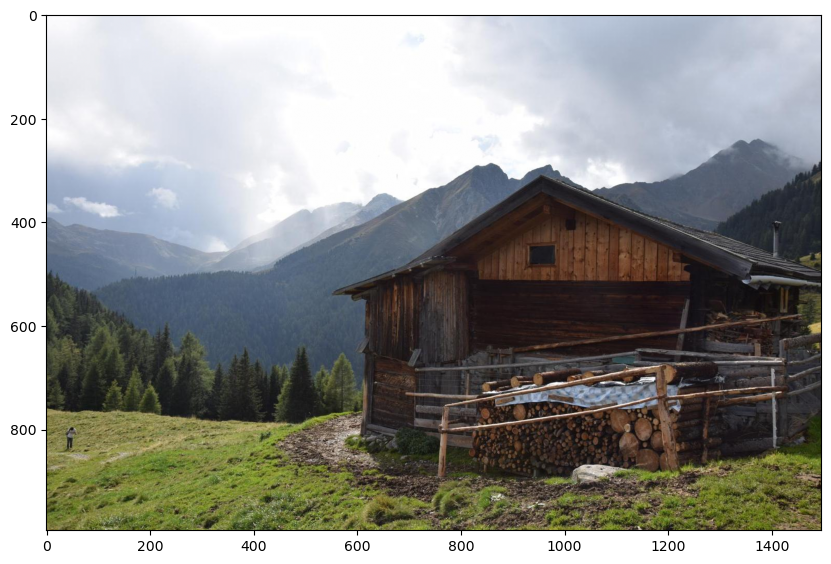

In [3]:
#load the image
img_shed = img_as_float(io.imread('data/resources/shed.png'))
#will load the pic as float and normalize to [0,1]
fig, ax = plt.subplots(figsize=(10, 7.5))
ax.imshow(img_shed)
plt.show()

Add Gaussian noise with variance 0.01, have N=5 noisy image and story them in array

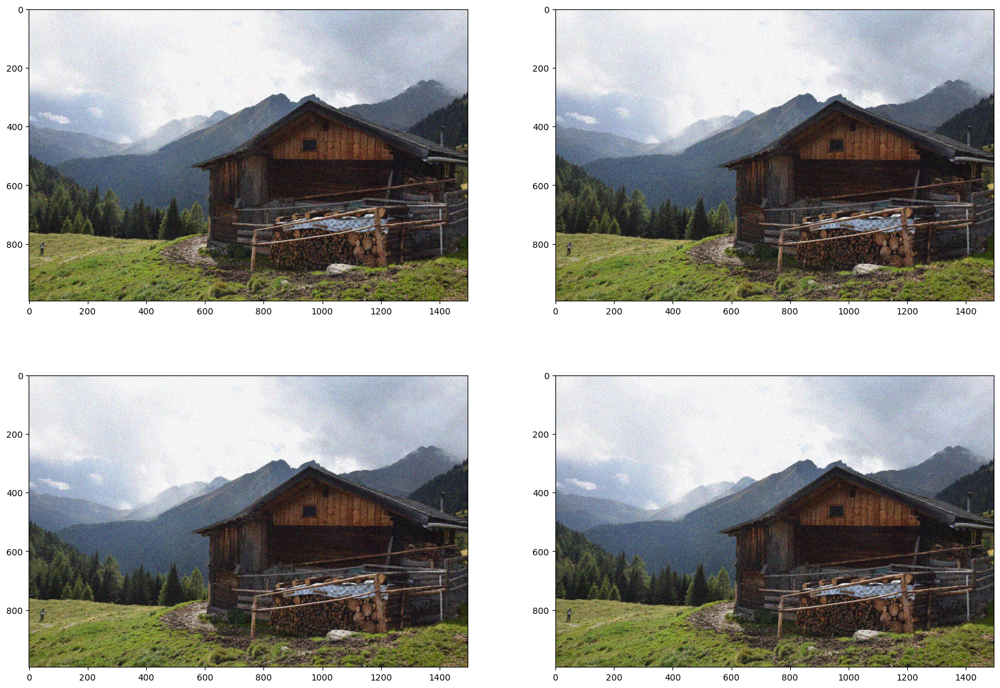

In [4]:
N = 5
vae = 0.01
imgs_noisy = []

for i in range(N):
    img_noisy = util.random_noise(img_shed,'gaussian',var=vae)
    imgs_noisy.append(img_noisy)

fig, axs = plt.subplots(2, 2, figsize=(20, 14))
for i, img_noisy in enumerate(imgs_noisy[:4]):
    axs.flat[i].imshow(img_noisy)
plt.show()

When the scene is static, only the camera produce a lot of noise, can use image averaging to reduce the noise

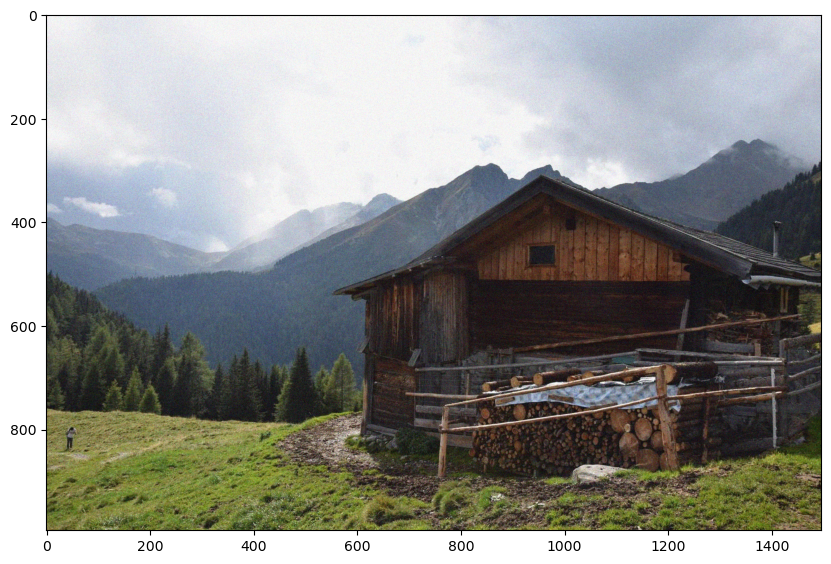

In [5]:
img_averaged = np.sum(np.stack(imgs_noisy,axis=0), axis=0) / N
#stack along first dimension(num.),then add on this dimension
plt.figure(figsize=(10, 7))
plt.imshow(img_averaged)
plt.show()

Morphological Filter

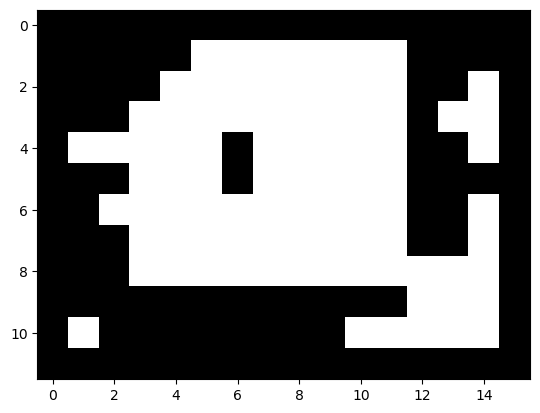

In [14]:
#load the object pic. as bool type

img = img_as_bool(io.imread('data/resources/object.png'))
plt.imshow(img,cmap='gray')
plt.show()

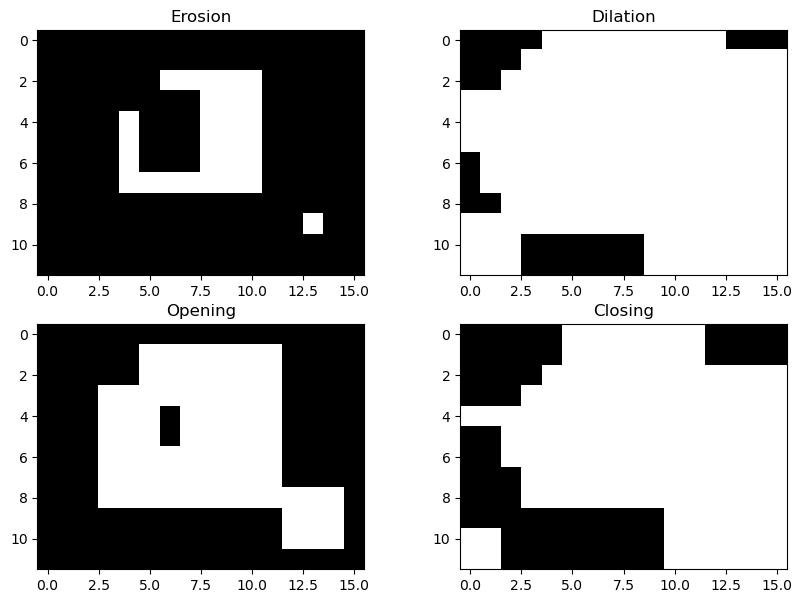

In [17]:
#do erosion, dilation, opening and closing
#creat 3x3 mask
structure = np.ones((3, 3))

img_eroded = morphology.erosion(img, structure)
img_dilated = morphology.dilation(img, structure)
img_opened = morphology.opening(img, structure)
img_closed = morphology.closing(img, structure)

fig, axs = plt.subplots(2, 2, figsize=(10, 7))#draw
axs[0, 0].imshow(img_eroded, cmap='gray'),axs[0, 0].set_title('Erosion')
axs[0, 1].imshow(img_dilated, cmap='gray'),axs[0, 1].set_title('Dilation')
axs[1, 0].imshow(img_opened, cmap='gray'),axs[1, 0].set_title('Opening')
axs[1, 1].imshow(img_closed, cmap='gray'),axs[1, 1].set_title('Closing')
plt.show()

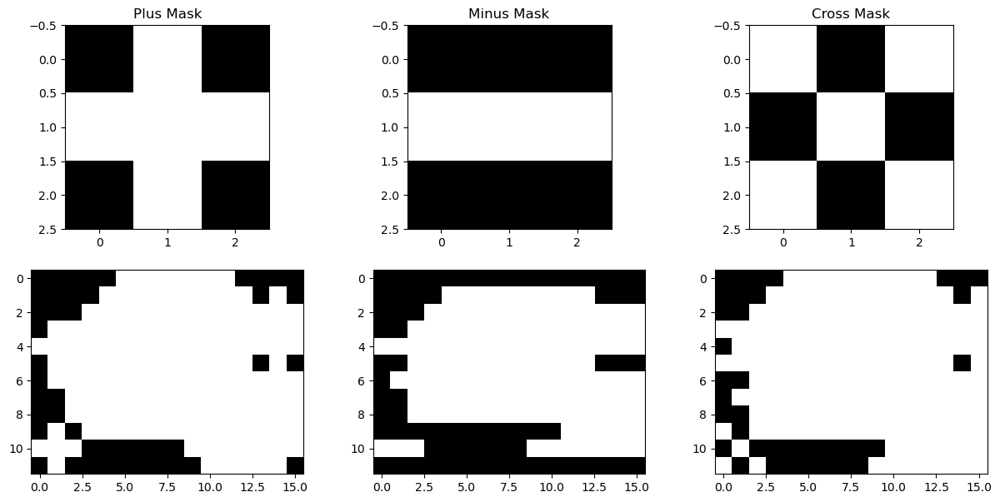

In [18]:
#for other masks: the difference are just the 1 and 0 in the matrix
#mask 'plus'
structure_plus = np.zeros((3, 3))
structure_plus[1,:] = 1
structure_plus[:,1] = 1

#structure 'minus'
structure_minus = np.zeros((3, 3))
structure_minus[1,:] = 1

#structure cross
structure_cross = np.zeros((3, 3))
np.fill_diagonal(structure_cross,1)
np.fill_diagonal(structure_cross[:,::-1],1)#::-1 means horizontal flipping

#example do the dilation
img_dilated_plus = morphology.dilation(img, structure_plus)
img_dilated_minus = morphology.dilation(img, structure_minus)
img_dilated_cross = morphology.dilation(img, structure_cross)
#show
fig, axs = plt.subplots(2, 3, figsize=(15, 7))
axs[0, 0].imshow(structure_plus, cmap='gray'),axs[0, 0].set_title('Plus Mask')
axs[0, 1].imshow(structure_minus, cmap='gray'),axs[0, 1].set_title('Minus Mask')
axs[0, 2].imshow(structure_cross, cmap='gray'),axs[0, 2].set_title('Cross Mask')
axs[1, 0].imshow(img_dilated_plus, cmap='gray')
axs[1, 1].imshow(img_dilated_minus, cmap='gray')
axs[1, 2].imshow(img_dilated_cross, cmap='gray')
plt.show()

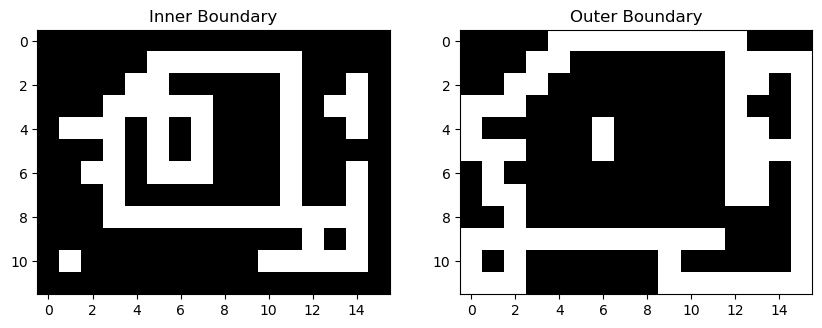

In [20]:
#do the eXclusive OR (XOR): inner boundary = original - erosion,  outer boundary = original - dilation
inner_boundary = np.logical_xor(img, img_eroded)
outer_boundary = np.logical_xor(img, img_dilated)
#show
fig, axs = plt.subplots(1, 2, figsize=(10, 3.5))
axs[0].imshow(inner_boundary, cmap='gray'),axs[0].set_title('Inner Boundary')
axs[1].imshow(outer_boundary, cmap='gray'),axs[1].set_title('Outer Boundary')
plt.show()

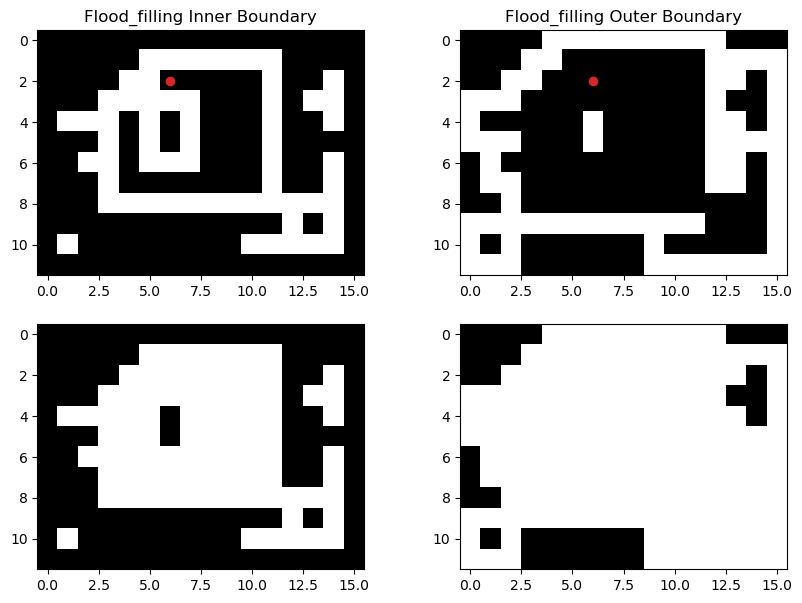

In [28]:
#use flood_fill to fill the same value area (need a seed point)
seed_point = (2, 6)
img_inner_filled = morphology.flood_fill(inner_boundary, seed_point, 1)
img_outer_filled = morphology.flood_fill(outer_boundary, seed_point, 1)
#show
fig, axs = plt.subplots(2, 2, figsize=(10, 7))
axs[0, 0].imshow(inner_boundary, cmap='gray'),axs[0, 0].set_title('Flood_filling Inner Boundary')
axs[0, 0].scatter(seed_point[1], seed_point[0], marker='o', color='tab:red')#use Tableau 20 color red
axs[0, 1].imshow(outer_boundary, cmap='gray'),axs[0, 1].set_title('Flood_filling Outer Boundary')
axs[0, 1].scatter(seed_point[1], seed_point[0], marker='o', color='tab:red')
#scatter is from matplotlib, use coordinate (x,y) to locate
axs[1, 0].imshow(img_inner_filled, cmap='gray')
axs[1, 1].imshow(img_outer_filled, cmap='gray')
plt.show()

Interactive Widget

interactive(children=(IntSlider(value=25, description='N', max=50, min=1), FloatSlider(value=0.099999999999999…

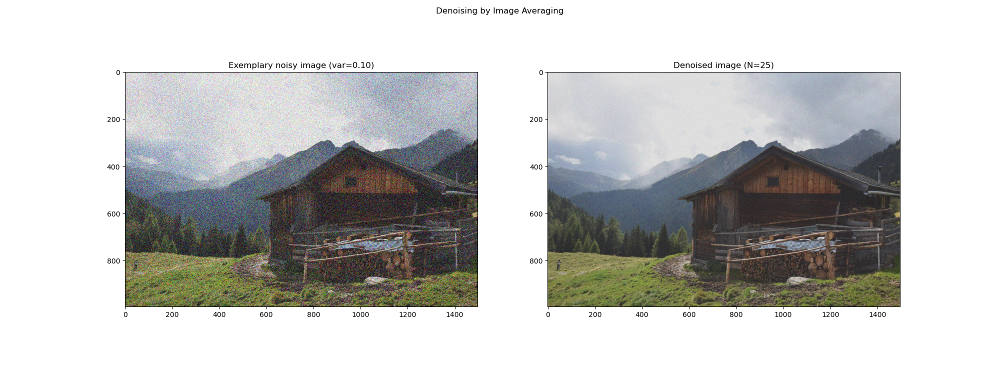

In [30]:
%matplotlib widget
import ipywidgets as widgets

fig, axs = plt.subplots(1, 2, figsize=(20, 7.5))
fig.suptitle("Denoising by Image Averaging")


def update(N, var):
    img_noisy_example = util.random_noise(img_shed, 'gaussian', var=var)
    img_noisy_sum = np.zeros(img_shed.shape)
    for i in range(N):
        img_noisy_sum += util.random_noise(img_shed, 'gaussian', var=var)
    img_denoised = img_noisy_sum / N

    axs[0].clear()
    axs[0].imshow(img_noisy_example), axs[0].set_title(f"Exemplary noisy image (var={var:.2f})")

    axs[1].clear()
    axs[1].imshow(img_denoised), axs[1].set_title(f"Denoised image (N={N})")


widgets.interact(update, N=(1, 50), var=(0.01, 0.2, 0.01), continuous_update=False);


interactive(children=(IntSlider(value=7, description='seed_point_x', max=15), IntSlider(value=5, description='…

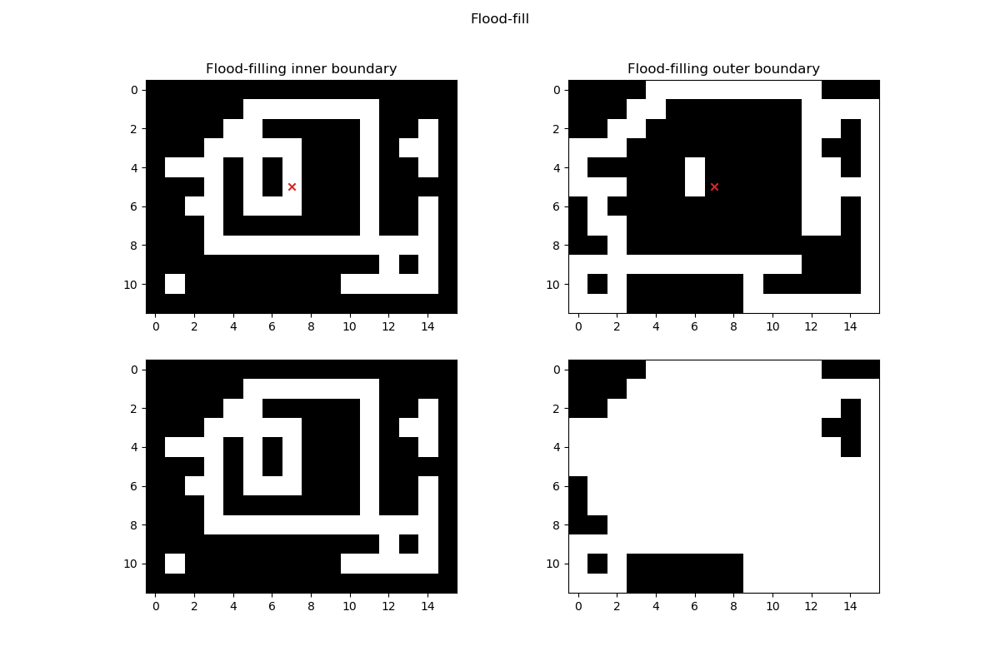

In [31]:
%matplotlib widget
import ipywidgets as widgets

fig, axs = plt.subplots(2, 2, figsize=(12,8))
fig.suptitle("Flood-fill")

def update(seed_point_x, seed_point_y):
    seed_point = (seed_point_y, seed_point_x)
    img_inner_filled = morphology.flood_fill(inner_boundary, seed_point, 1)
    img_outer_filled = morphology.flood_fill(outer_boundary, seed_point, 1)
    
    for ax in axs.flat:
        ax.clear()
        
    axs[0, 0].imshow(inner_boundary, cmap='gray'), axs[0, 0].set_title("Flood-filling inner boundary")
    axs[0, 0].scatter(seed_point[1], seed_point[0], color='tab:red', marker='x')
    axs[1, 0].imshow(img_inner_filled, cmap='gray')
    axs[0, 1].imshow(outer_boundary, cmap='gray'), axs[0, 1].set_title("Flood-filling outer boundary")
    axs[0, 1].scatter(seed_point[1], seed_point[0], color='tab:red', marker='x')
    axs[1, 1].imshow(img_outer_filled, cmap='gray')

widgets.interact(update, seed_point_x=(0, img.shape[1]-1), seed_point_y=(0, img.shape[0]-1));